In [20]:
import os
import pandas as pd
import numpy as np
import cv2
from PIL import Image
import matplotlib.pyplot as plt

In [29]:
edge_path = "D:\\sketch-to-artwork\\Repo\\sketch-to-artwork\\logs\\2021-09-30T18-40-24_wikiart_edges_vqgan\\images\\val"
real_path = "D:\\sketch-to-artwork\\Repo\\sketch-to-artwork\\logs\\2021-09-30T01-22-37_wikiart_vqgan\\images\\val"

In [51]:
real = []
for dirpath, dirnames, filenames in os.walk(real_path):
    for filename in filenames:
        if "reconstructions" in filename:
            fullpath = os.path.join(dirpath, filename)
            real.append(cv2.cvtColor(cv2.imread(fullpath), cv2.COLOR_BGR2RGB))

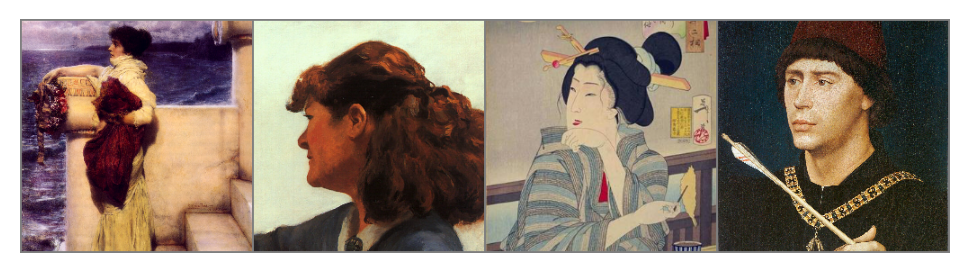

In [52]:
plt.figure(dpi=200)
plt.imshow(cv2.cvtColor(cv2.imread("D:\\sketch-to-artwork\\Repo\\sketch-to-artwork\\logs\\2021-09-30T01-22-37_wikiart_vqgan\\images\\val\inputs_gs-000000_e-000000_b-000000.png"), cv2.COLOR_BGR2RGB), cmap="gray")
plt.axis('off')
plt.show()


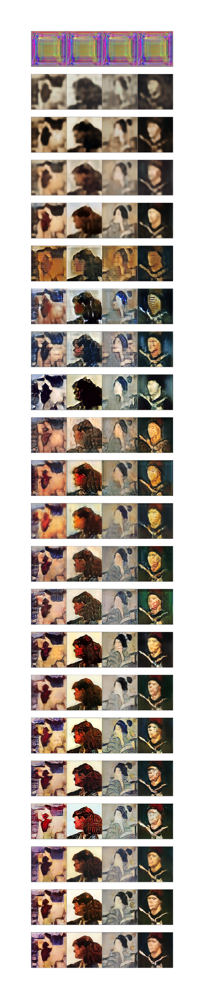

In [59]:
fig = plt.figure(dpi=2000)
for i in range(len(real)):
    a = fig.add_subplot(len(real),1,i+1)
    plt.imshow(real[i])
    plt.axis('off')

In [69]:
edge = []
for dirpath, dirnames, filenames in os.walk(edge_path):
    for filename in filenames:
        if "reconstructions" in filename:
            fullpath = os.path.join(dirpath, filename)
            edge.append(cv2.cvtColor(cv2.imread(fullpath), cv2.COLOR_BGR2GRAY))

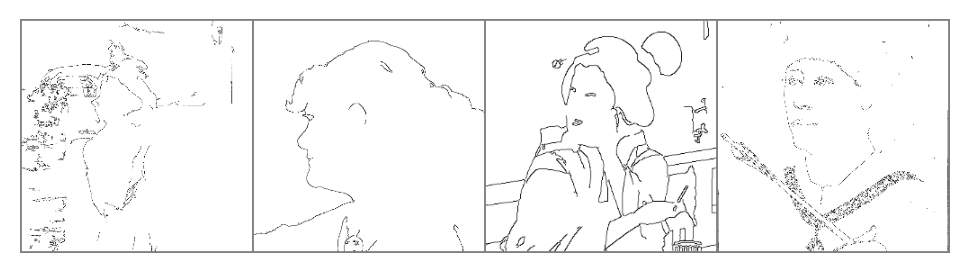

In [70]:
plt.figure(dpi=200)
plt.imshow(cv2.cvtColor(cv2.imread("D:\\sketch-to-artwork\\Repo\\sketch-to-artwork\\logs\\2021-09-30T18-40-24_wikiart_edges_vqgan\\images\\val\\inputs_gs-000000_e-000000_b-000000.png"), cv2.COLOR_BGR2GRAY), cmap="gray")
plt.axis('off')
plt.show()

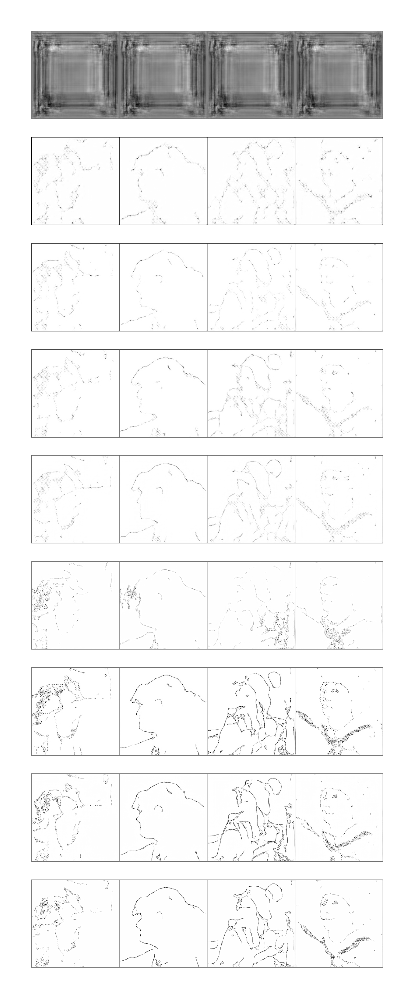

In [121]:
fig = plt.figure(dpi=1000)
for i in range(len(edge)):
    a = fig.add_subplot(len(edge),1,i+1)
    plt.imshow(edge[i], cmap="gray")
    plt.axis('off')

In [112]:
metrics = pd.read_csv("..\\logs\\2021-09-30T01-22-37_wikiart_vqgan\\testtube\\version_0\\metrics.csv")
metrics.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7008 entries, 0 to 7007
Data columns (total 83 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   val/rec_loss_step/epoch_0   285 non-null    float64
 1   val/aeloss_step/epoch_0     285 non-null    float64
 2   created_at                  7008 non-null   object 
 3   train/aeloss_step           1021 non-null   float64
 4   train/total_loss_step       1021 non-null   float64
 5   train/quant_loss_step       1021 non-null   float64
 6   train/nll_loss_step         1021 non-null   float64
 7   train/rec_loss_step         1021 non-null   float64
 8   train/p_loss_step           1021 non-null   float64
 9   train/d_weight_step         1021 non-null   float64
 10  train/disc_factor_step      1021 non-null   float64
 11  train/g_loss_step           1021 non-null   float64
 12  train/discloss_step         1021 non-null   float64
 13  train/disc_loss_step        1021 

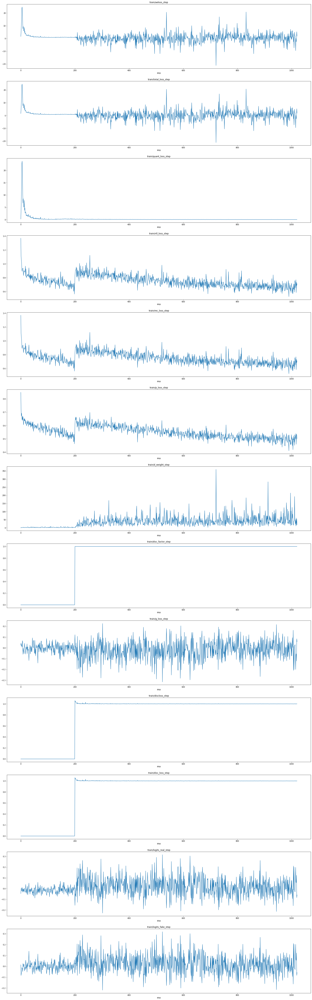

In [119]:
values = metrics.iloc[:,3:16].dropna().values
labels = ["train/aeloss_step",
        "train/total_loss_step",
        "train/quant_loss_step",
        "train/nll_loss_step",
        "train/rec_loss_step",
        "train/p_loss_step",
        "train/d_weight_step",
        "train/disc_factor_step",
        "train/g_loss_step",
        "train/discloss_step",
        "train/disc_loss_step",
        "train/logits_real_step",
        "train/logits_fake_step"]

plt.figure(figsize=(30,100))
for i in range(values.shape[1]):
    plt.subplot(values.shape[1],1,i+1)
    plt.plot(values[:,i])
    plt.xlabel("step")
    plt.title(labels[i])

plt.show()

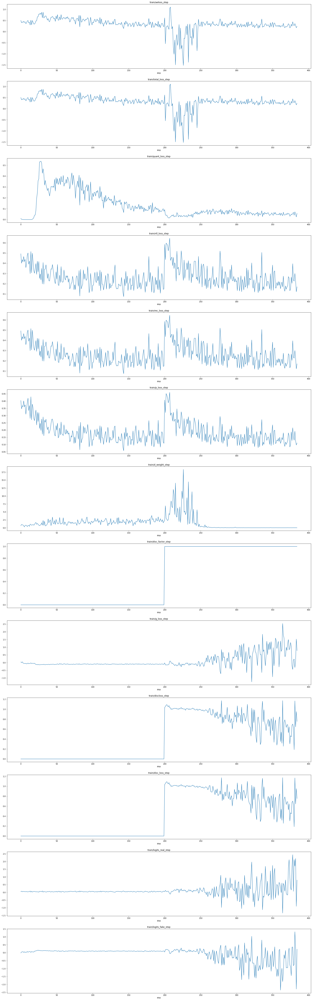

In [123]:
metrics_edge = pd.read_csv("..\\logs\\2021-09-30T18-40-24_wikiart_edges_vqgan\\testtube\\version_0\\metrics.csv")

values_edge = metrics_edge.iloc[:,3:16].dropna().values
labels = ["train/aeloss_step",
        "train/total_loss_step",
        "train/quant_loss_step",
        "train/nll_loss_step",
        "train/rec_loss_step",
        "train/p_loss_step",
        "train/d_weight_step",
        "train/disc_factor_step",
        "train/g_loss_step",
        "train/discloss_step",
        "train/disc_loss_step",
        "train/logits_real_step",
        "train/logits_fake_step"]

plt.figure(figsize=(30,100))
for i in range(values_edge.shape[1]):
    plt.subplot(values_edge.shape[1],1,i+1)
    plt.plot(values_edge[:,i])
    plt.xlabel("step")
    plt.title(labels[i])

plt.show()